In [1]:
%store -r

In [2]:
test_06_ct20s

In [3]:
import sys
sys.path.append("../scripts/python")
sys.path.append("../algotom")
import amglib.imageutils as utils
import amglib.readers as io
from tqdm.notebook import tqdm

import numpy as np
import matplotlib.pyplot as plt
import skimage as im
import scipy.io
import os
from skimage.measure import EllipseModel
from matplotlib.patches import Ellipse
import importlib

# Import all CIL components needed
from cil.framework import ImageData, ImageGeometry
from cil.framework import AcquisitionGeometry, AcquisitionData

# CIL Processors
from cil.processors import CentreOfRotationCorrector, Slicer, TransmissionAbsorptionConverter, Normaliser, Padder

# CIL display tools
from cil.utilities.display import show2D, show_geometry

# From CIL ASTRA plugin
from cil.plugins.astra import ProjectionOperator, FBP

from cil.processors import RingRemover, Binner
from cil.utilities.jupyter import islicer, link_islicer
from cil.processors import Masker, MaskGenerator

import logging
logging.basicConfig(level=logging.WARNING)
cil_log_level = logging.getLogger('cil.processors')
cil_log_level.setLevel(logging.INFO)

C:\Users\zhan_q\Documents\CIL\../scripts/python\amglib\imageutils.py:8: FutureWarning: Importing from skimage.morphology.greyreconstruct is deprecated. Please import from skimage.morphology instead.
  import skimage.morphology.greyreconstruct as rec


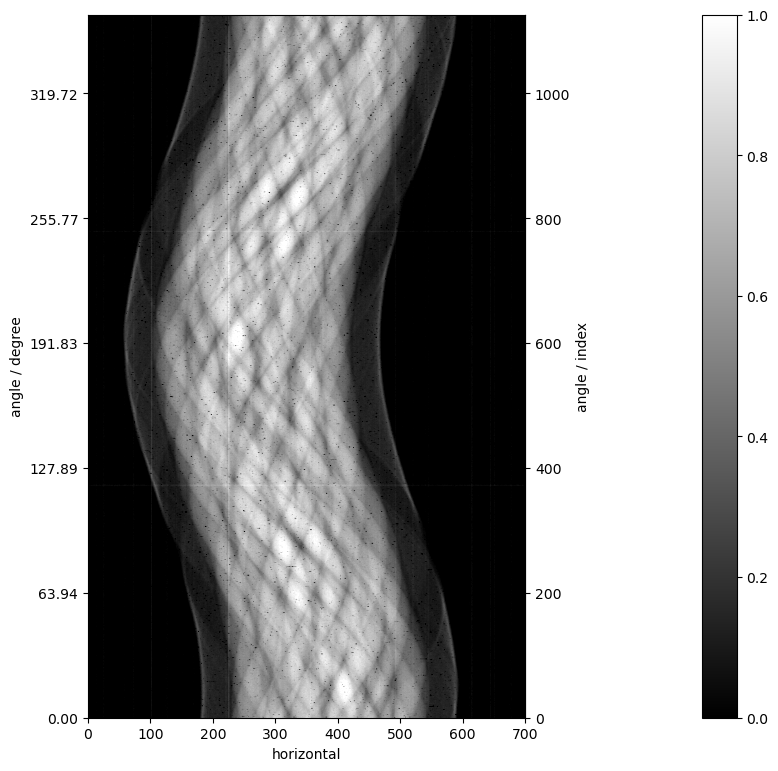

In [4]:
nv = 600

data2D = test_06_ct20s.get_slice(vertical=nv)
show2D(data2D,\
      fix_range=(0,1.0),
      cmap='gray')

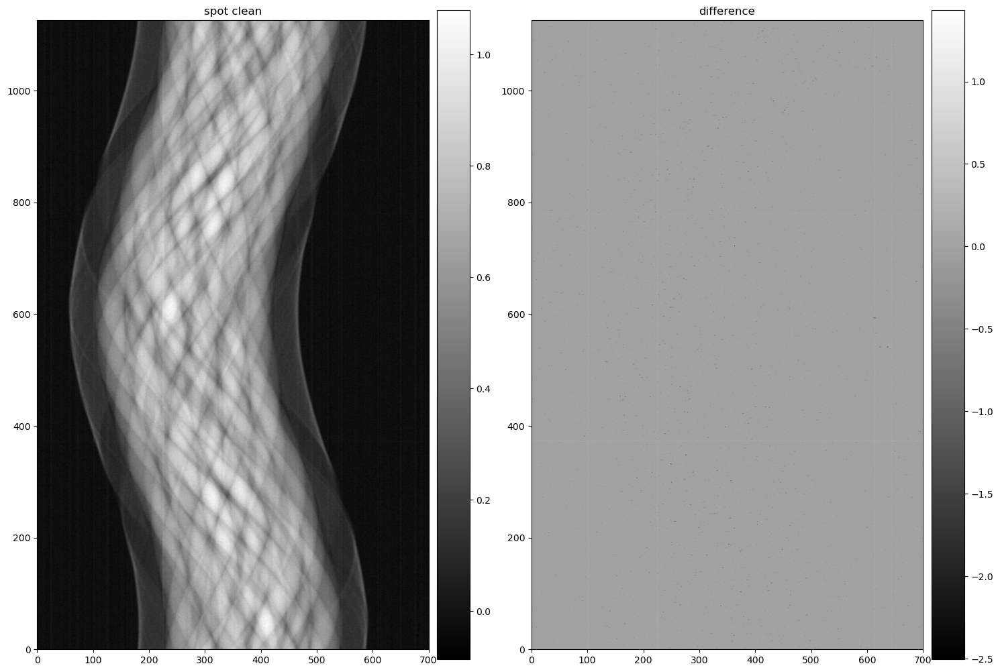

In [5]:
sino0 = utils.spotclean(data2D.as_array(),size=5,threshold=0.95)
sino0 = sino0.astype('float32')

show2D([sino0, 
        #data2D.as_array(), 
        data2D.as_array()-sino0],
       ['spot clean', 
        #'original', 
        'difference'],
       #fix_range=(0,1.2),
       #num_cols=3
      )

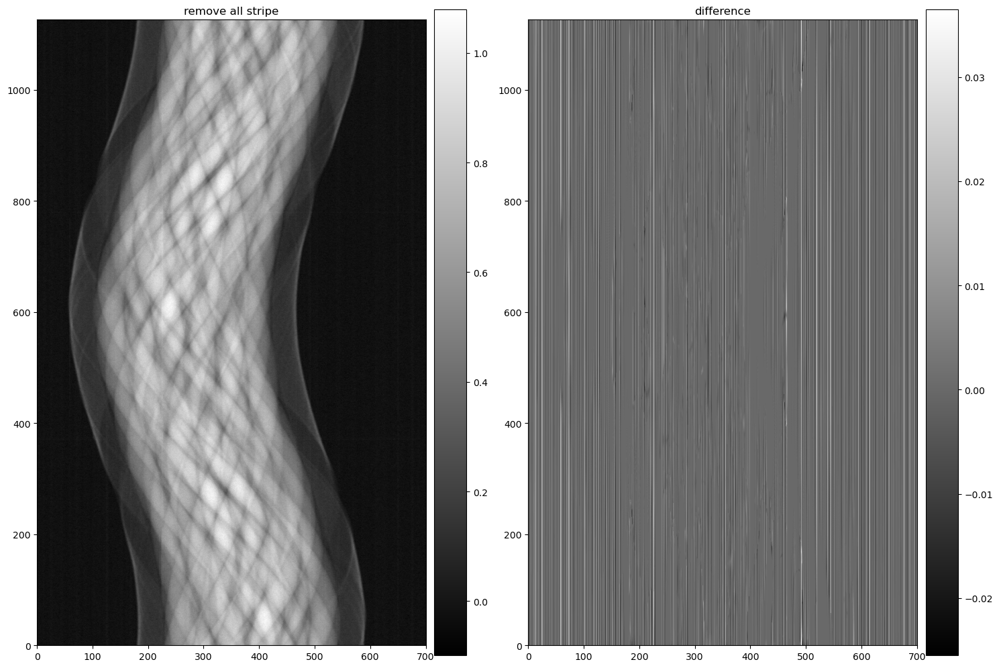

In [23]:
import algotom.prep.removal as srm

sino1 = srm.remove_stripe_based_filtering(sino0, sigma=3, size=5, 
                      dim=2, sort=True)
sino1 = sino1.astype('float32')
show2D([sino1, sino0-sino1],
       ['remove all stripe', 'difference'],
      )

In [19]:
data_clean = data2D.clone()
data_clean.fill(sino1)

In [20]:
data_clean = CentreOfRotationCorrector.image_sharpness('centre',\
                                                            backend='astra',\
                                                        search_range=150, \
                                                            tolerance=0.005)(data_clean)

INFO:cil.processors.CofR_image_sharpness:evaluated 17 points
INFO:cil.processors.CofR_image_sharpness:Centre of rotation correction found using image_sharpness
INFO:cil.processors.CofR_image_sharpness:backend FBP/FDK astra
INFO:cil.processors.CofR_image_sharpness:Calculated from slice: centre
INFO:cil.processors.CofR_image_sharpness:Centre of rotation shift = -25.785547 pixels
INFO:cil.processors.CofR_image_sharpness:Centre of rotation shift = -25.785547 units at the object
INFO:cil.processors.CofR_image_sharpness:Return new dataset with centred geometry


In [21]:
data_clean2 = Slicer(roi={'angle': (0,-1,2)})(data_clean)
data_clean4 = Slicer(roi={'angle': (0,-1,4)})(data_clean)
data_clean8 = Slicer(roi={'angle': (0,-1,8)})(data_clean)

ig2D = data_clean.geometry.get_ImageGeometry()
ag2D = data_clean.geometry

ig2D2 = data_clean2.geometry.get_ImageGeometry()
ag2D2 = data_clean2.geometry

ig2D4 = data_clean4.geometry.get_ImageGeometry()
ag2D4 = data_clean4.geometry

ig2D8 = data_clean8.geometry.get_ImageGeometry()
ag2D8 = data_clean8.geometry

fbp_recon_2D = FBP(ig2D, ag2D, device='gpu')(data_clean)
fbp_recon_2D2 = FBP(ig2D2, ag2D2, device='gpu')(data_clean2)
fbp_recon_2D4 = FBP(ig2D4, ag2D4, device='gpu')(data_clean4)
fbp_recon_2D8 = FBP(ig2D8, ag2D8, device='gpu')(data_clean8)

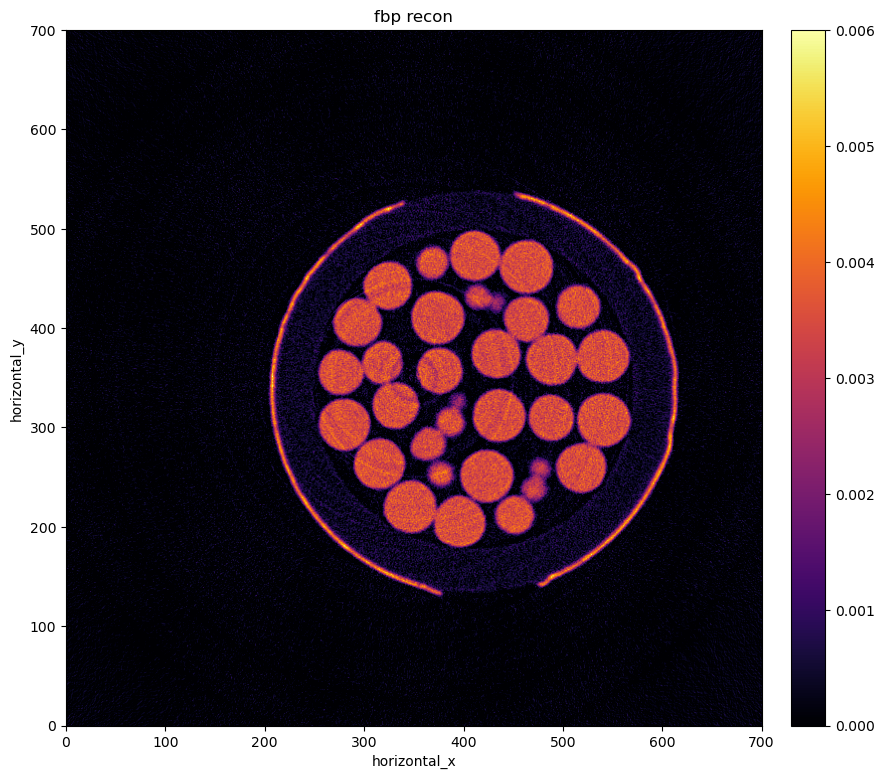

In [22]:
show2D(fbp_recon_2D, 'fbp recon', cmap='inferno', fix_range=(0, 0.006))

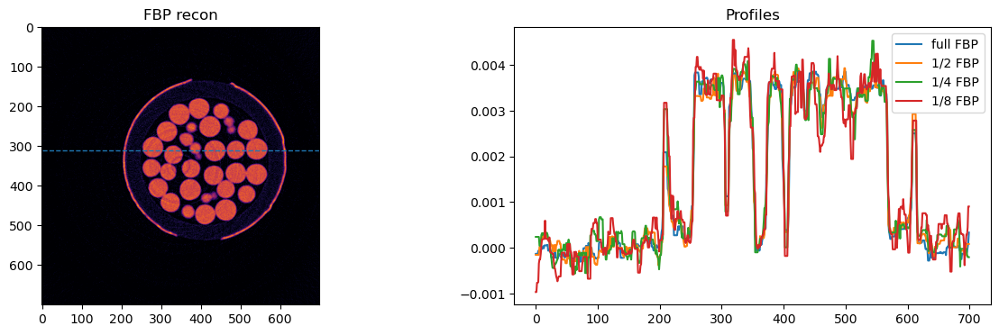

In [24]:
import skimage.filters as filt
import matplotlib.pyplot as plt

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

nh = 310
fig, ax = plt.subplots(1,2,figsize=(15,4))
ax[0].imshow(fbp_recon_2D.as_array(),vmin=0,vmax=0.006,cmap='inferno')
ax[0].set_title('FBP recon')
ax[0].hlines(nh,xmin=0,xmax=699,color=colors[0], ls = '--', linewidth=1)

N=10
ax[1].plot(filt.median(fbp_recon_2D.as_array()[nh],np.ones(N)),label="full FBP")
ax[1].plot(filt.median(fbp_recon_2D2.as_array()[nh],np.ones(N)),label="1/2 FBP")
ax[1].plot(filt.median(fbp_recon_2D4.as_array()[nh],np.ones(N)),label="1/4 FBP")
ax[1].plot(filt.median(fbp_recon_2D8.as_array()[nh],np.ones(N)),label="1/8 FBP")
ax[1].set_title('Profiles')
ax[1].legend()

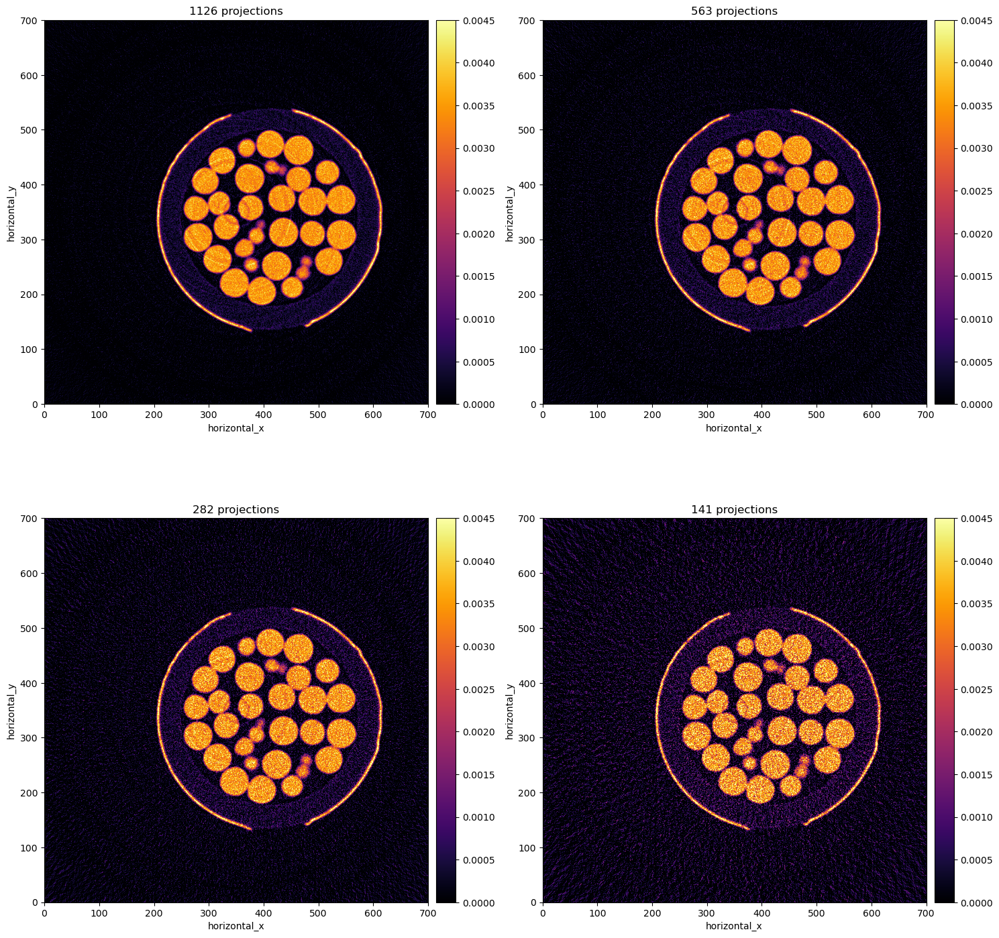

In [25]:
show2D([fbp_recon_2D, fbp_recon_2D2, fbp_recon_2D4, fbp_recon_2D8],
      ['1126 projections', '563 projections', '282 projections', '141 projections'], 
      cmap = 'inferno', 
      fix_range=(0,0.0045))

### SIRT recons

In [26]:
from cil.plugins.astra.operators import ProjectionOperator
from cil.optimisation.algorithms import SIRT
"""
#data_clean = CentreOfRotationCorrector.image_sharpness('centre',\
#                                                            backend='astra',\
#                                                        search_range=250, \
#                                                            tolerance=0.005)(data_clean)
data_clean2 = Slicer(roi={'angle': (0,-1,2)})(data_clean)
data_clean4 = Slicer(roi={'angle': (0,-1,4)})(data_clean)
data_clean8 = Slicer(roi={'angle': (0,-1,8)})(data_clean)

#ig2D = data_clean.geometry.get_ImageGeometry()
#ag2D = data_clean.geometry

ig2D2 = data_clean2.geometry.get_ImageGeometry()
ag2D2 = data_clean2.geometry

ig2D4 = data_clean4.geometry.get_ImageGeometry()
ag2D4 = data_clean4.geometry

ig2D8 = data_clean8.geometry.get_ImageGeometry()
ag2D8 = data_clean8.geometry
"""
A = ProjectionOperator(ig2D,ag2D, device="gpu")
A2 = ProjectionOperator(ig2D2,ag2D2, device="gpu")
A4 = ProjectionOperator(ig2D4,ag2D4, device="gpu")
A8 = ProjectionOperator(ig2D8,ag2D8, device="gpu")


x00 = ig2D.allocate(0.0)
x02 = ig2D2.allocate(0.0)
x04 = ig2D4.allocate(0.0)
x08 = ig2D8.allocate(0.0)
sirt00 = SIRT(initial=x00, operator=A, data=data_clean, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirt02 = SIRT(initial=x02, operator=A2, data=data_clean2, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirt04 = SIRT(initial=x04, operator=A4, data=data_clean4, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirt08 = SIRT(initial=x08, operator=A8, data=data_clean8, max_iteration=3000, lower=0.0, update_objective_interval=50)

C:\Users\zhan_q\.conda\envs\cil\lib\site-packages\cil\framework\framework.py:2265: RuntimeWarning: divide by zero encountered in power
  out = pwop(self.as_array() , x2 , *args, **kwargs )


In [27]:
sirt00.run(1000, verbose=1)
sirt02.run(1000, verbose=1)
sirt04.run(1000, verbose=1)
sirt08.run(1000, verbose=1)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       3000         0.000          1.50202e+05
       50       3000         0.095          9.52239e+02
      100       3000         0.094          5.56775e+02
      150       3000         0.093          4.65496e+02
      200       3000         0.093          4.32177e+02
      250       3000         0.092          4.16655e+02
      300       3000         0.092          4.08201e+02
      350       3000         0.092          4.03044e+02
      400       3000         0.092          3.99618e+02
      450       3000         0.091          3.97183e+02
      500       3000         0.091          3.95357e+02
      550       3000         0.091          3.93924e+02
      600       3000         0.090          3.92758e+02
      650       3000         0.091          3.91782e+02
      700       3000         0.091          3.90947e+02
      750       3000         0.091          3.90

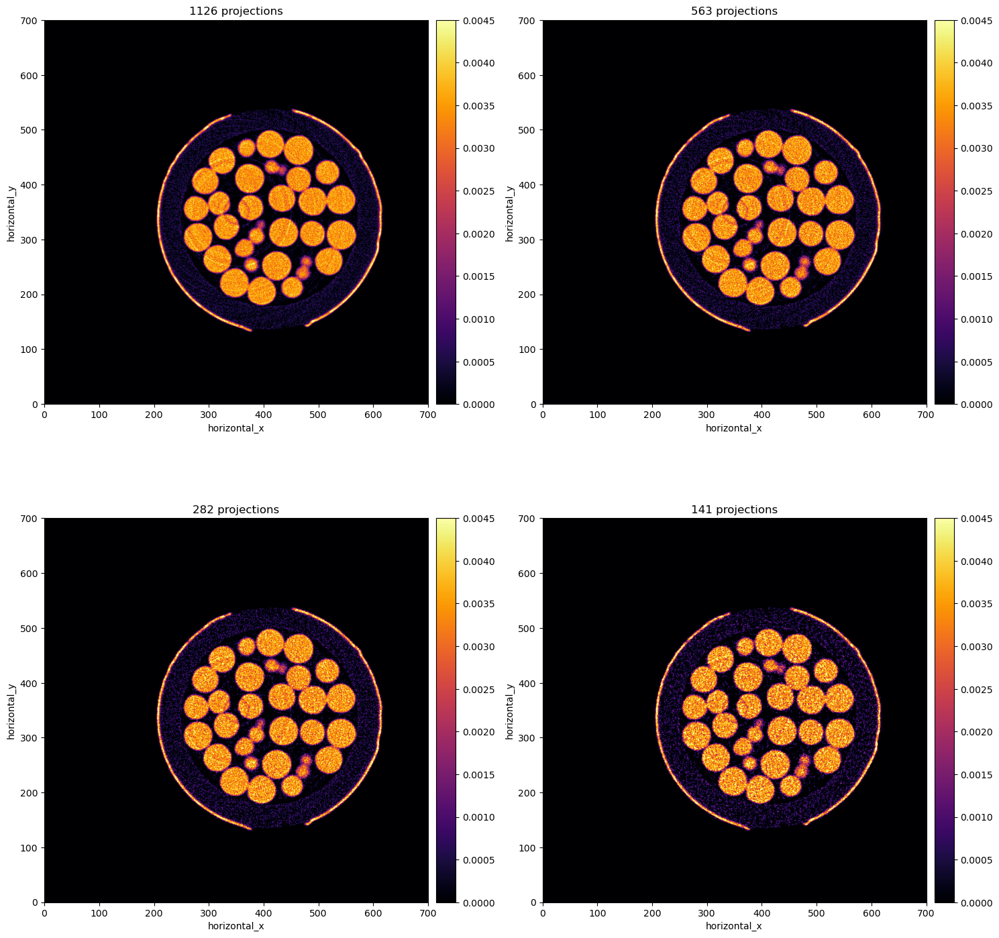

In [28]:
show2D([sirt00.solution, sirt02.solution, sirt04.solution, sirt08.solution],
      ['1126 projections', '563 projections', '282 projections', '141 projections'], 
      cmap = 'inferno', 
      fix_range=(0,0.0045))

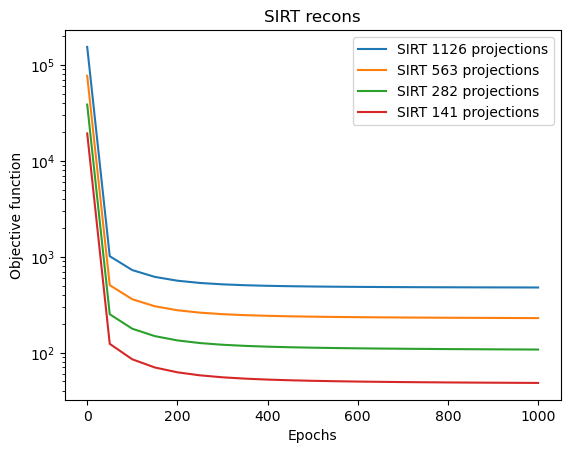

In [38]:
plt.semilogy(np.arange(0,sirt00.iteration+sirt00.update_objective_interval, sirt00.update_objective_interval),
             sirt00.objective, label='SIRT 1126 projections')
plt.semilogy(np.arange(0,sirt02.iteration+sirt02.update_objective_interval, sirt02.update_objective_interval),
             sirt02.objective, label='SIRT 563 projections')
plt.semilogy(np.arange(0,sirt04.iteration+sirt04.update_objective_interval, sirt04.update_objective_interval),
             sirt04.objective, label='SIRT 282 projections')
plt.semilogy(np.arange(0,sirt08.iteration+sirt08.update_objective_interval, sirt08.update_objective_interval),
             sirt08.objective, label='SIRT 141 projections')
#plt.xscale('log')
plt.xlabel('Epochs')
plt.ylabel('Objective function')
plt.title('SIRT recons')
plt.legend()

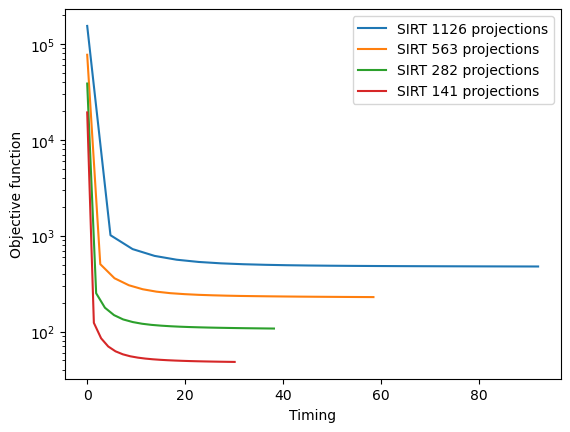

In [39]:
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt00.timing)[-1:0:-sirt00.update_objective_interval]))), 
             sirt00.objective, label='SIRT 1126 projections')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt02.timing)[-1:0:-sirt02.update_objective_interval]))), 
             sirt02.objective, label='SIRT 563 projections')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt04.timing)[-1:0:-sirt04.update_objective_interval]))), 
             sirt04.objective, label='SIRT 282 projections')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt08.timing)[-1:0:-sirt08.update_objective_interval]))), 
             sirt08.objective, label='SIRT 141 projections')

plt.xlabel('Timing')
plt.ylabel('Objective function')
plt.legend()

In [40]:
sirtfbp0 = SIRT(initial=fbp_recon_2D, operator=A, data=data_clean, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirtfbp2 = SIRT(initial=fbp_recon_2D2, operator=A2, data=data_clean2, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirtfbp4 = SIRT(initial=fbp_recon_2D4, operator=A4, data=data_clean4, max_iteration=3000, lower=0.0, update_objective_interval=50)
sirtfbp8 = SIRT(initial=fbp_recon_2D8, operator=A8, data=data_clean8, max_iteration=3000, lower=0.0, update_objective_interval=50)

In [36]:
sirtfbp0.run(1000, verbose=1)
sirtfbp2.run(1000, verbose=1)
sirtfbp4.run(1000, verbose=1)
sirtfbp8.run(1000, verbose=1)

     Iter   Max Iter     Time/Iter            Objective
                               [s]                     
        0       3000         0.000          1.50306e+05
       50       3000         0.096          4.26083e+02
      100       3000         0.094          4.23720e+02
      150       3000         0.096          4.22843e+02
      200       3000         0.095          4.22266e+02
      250       3000         0.095          4.21818e+02
      300       3000         0.094          4.21444e+02
      350       3000         0.095          4.21120e+02
      400       3000         0.094          4.20831e+02
      450       3000         0.094          4.20568e+02
      500       3000         0.094          4.20327e+02
      550       3000         0.094          4.20104e+02
      600       3000         0.094          4.19896e+02
      650       3000         0.093          4.19700e+02
      700       3000         0.093          4.19516e+02
      750       3000         0.093          4.19

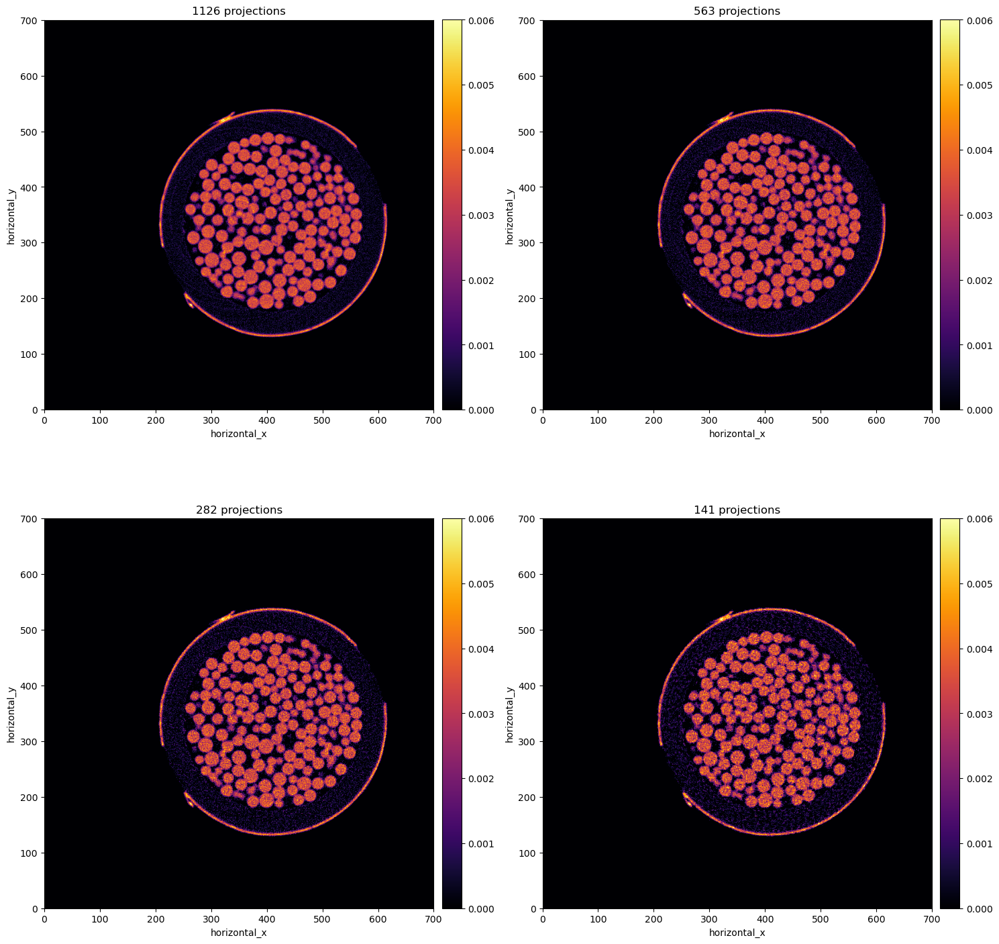

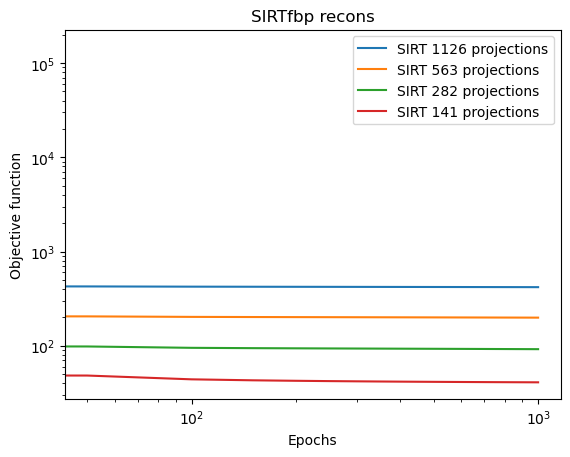

In [41]:
show2D([sirtfbp0.solution, sirtfbp2.solution, sirtfbp4.solution, sirtfbp8.solution],
      ['1126 projections', '563 projections', '282 projections', '141 projections'], 
      cmap = 'inferno', 
      fix_range=(0,0.006))
plt.semilogy(np.arange(0,sirtfbp0.iteration+sirtfbp0.update_objective_interval, sirtfbp0.update_objective_interval),
             sirtfbp0.objective, label='SIRT 1126 projections')
plt.semilogy(np.arange(0,sirtfbp2.iteration+sirtfbp2.update_objective_interval, sirtfbp2.update_objective_interval),
             sirtfbp2.objective, label='SIRT 563 projections')
plt.semilogy(np.arange(0,sirtfbp4.iteration+sirtfbp4.update_objective_interval, sirtfbp4.update_objective_interval),
             sirtfbp4.objective, label='SIRT 282 projections')
plt.semilogy(np.arange(0,sirtfbp8.iteration+sirtfbp8.update_objective_interval, sirtfbp8.update_objective_interval),
             sirtfbp8.objective, label='SIRT 141 projections')

plt.xlabel('Epochs')
plt.ylabel('Objective function')
plt.title('SIRTfbp recons')
plt.legend()

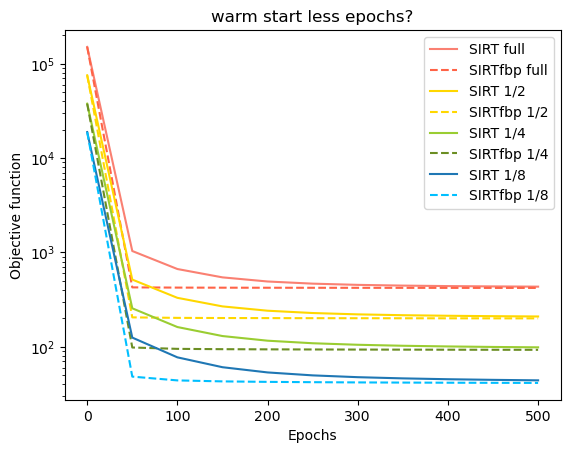

In [66]:
plt.semilogy(np.arange(0,500+sirt00.update_objective_interval, sirt00.update_objective_interval),
             sirt00.objective[0:11], label='SIRT full', color='salmon')
plt.semilogy(np.arange(0,500+sirtfbp0.update_objective_interval, sirtfbp0.update_objective_interval),
             sirtfbp0.objective[0:11], label='SIRTfbp full', ls = '--', color='tomato')

plt.semilogy(np.arange(0,500+sirt02.update_objective_interval, sirt02.update_objective_interval),
             sirt02.objective[0:11], label='SIRT 1/2', color='gold')
plt.semilogy(np.arange(0,500+sirtfbp2.update_objective_interval, sirtfbp2.update_objective_interval),
             sirtfbp2.objective[0:11], label='SIRTfbp 1/2', ls='--', color='gold')

plt.semilogy(np.arange(0,500+sirt04.update_objective_interval, sirt04.update_objective_interval),
             sirt04.objective[0:11], label='SIRT 1/4', color='yellowgreen')
plt.semilogy(np.arange(0,500+sirtfbp4.update_objective_interval, sirtfbp4.update_objective_interval),
             sirtfbp4.objective[0:11], label='SIRTfbp 1/4', ls="--", color='olivedrab')

plt.semilogy(np.arange(0,500+sirt08.update_objective_interval, sirt08.update_objective_interval),
             sirt08.objective[0:11], label='SIRT 1/8')
plt.semilogy(np.arange(0,500+sirtfbp8.update_objective_interval, sirtfbp8.update_objective_interval),
             sirtfbp8.objective[0:11], label='SIRTfbp 1/8', ls="--", color='deepskyblue')
plt.xlabel('Epochs')
plt.ylabel('Objective function')
plt.title('warm start less epochs?')
plt.legend();

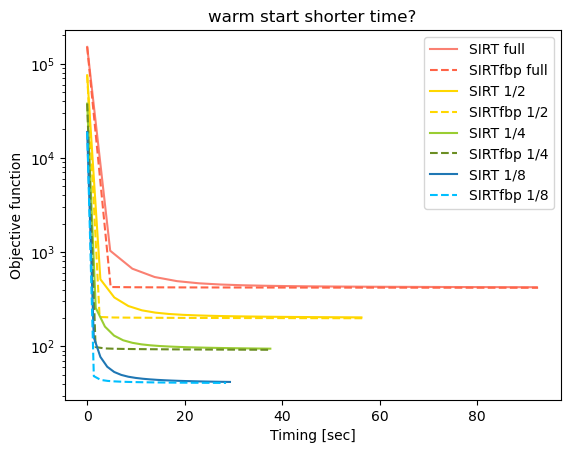

In [67]:
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt00.timing)[-1:0:-sirt00.update_objective_interval]))), 
             sirt00.objective, label='SIRT full', color='salmon')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp0.timing)[-1:0:-sirtfbp0.update_objective_interval]))), 
             sirtfbp0.objective, label='SIRTfbp full', ls = '--', color='tomato')

plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt02.timing)[-1:0:-sirt02.update_objective_interval]))), 
             sirt02.objective, label='SIRT 1/2', color='gold')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp2.timing)[-1:0:-sirtfbp2.update_objective_interval]))), 
             sirtfbp2.objective, label='SIRTfbp 1/2', ls='--', color='gold')

plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt04.timing)[-1:0:-sirt04.update_objective_interval]))), 
             sirt04.objective, label='SIRT 1/4', color='yellowgreen')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp4.timing)[-1:0:-sirtfbp4.update_objective_interval]))), 
             sirtfbp4.objective, label='SIRTfbp 1/4', ls="--", color='olivedrab')

plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirt08.timing)[-1:0:-sirt08.update_objective_interval]))), 
             sirt08.objective, label='SIRT 1/8')
plt.semilogy(np.concatenate(([0],np.sort(np.cumsum(sirtfbp8.timing)[-1:0:-sirtfbp8.update_objective_interval]))), 
             sirtfbp8.objective, label='SIRTfbp 1/8', ls="--", color='deepskyblue')
plt.xlabel('Timing [sec]')
plt.ylabel('Objective function')
plt.title('warm start shorter time?')
plt.legend();

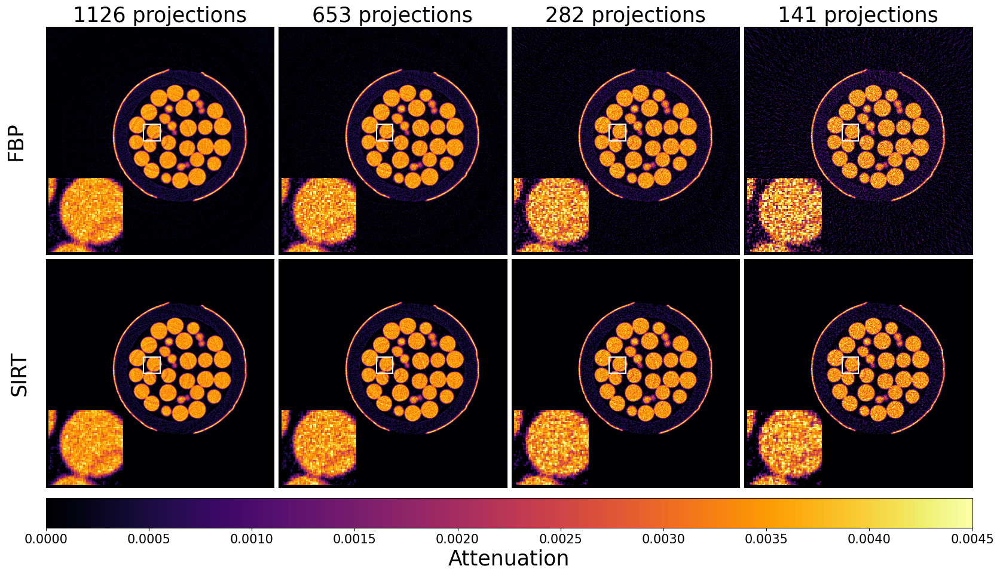

In [29]:
### Show fbp, sirt, sirt+fbp
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import numpy as np
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.inset_locator import InsetPosition
import matplotlib.patches as patches


recons = [fbp_recon_2D.as_array(), fbp_recon_2D2.as_array(), fbp_recon_2D4.as_array(), fbp_recon_2D8.as_array(),
         sirt00.solution.as_array(), sirt02.solution.as_array(), sirt04.solution.as_array(), sirt08.solution.as_array(),
         #sirtfbp0.solution.as_array(), sirtfbp2.solution.as_array(), sirtfbp4.solution.as_array(), sirtfbp8.solution.as_array()
         ]

labels_x = ["1126 projections", "653 projections", "282 projections", "141 projections"]
labels_y = ["FBP", "SIRT", "SIRTfbp"]

# set fontszie xticks/yticks
plt.rcParams['xtick.labelsize']=15
plt.rcParams['ytick.labelsize']=15

fig = plt.figure(figsize=(20, 20))

grid = AxesGrid(fig, 111,
                nrows_ncols=(2, 4),
                axes_pad=0.08,
                cbar_mode='single',
                cbar_location='bottom',
                cbar_size = 0.5,
                cbar_pad=0.1
                )

k = 0

for ax in grid:
    im = ax.imshow(recons[k],vmin=0,vmax=0.0045, cmap="inferno")
    
    axins = zoomed_inset_axes(ax, 3, loc=2)
    ip = InsetPosition(ax, [0.01, 0.01, 0.33, 0.33]) #posx, posy, width, height
    axins.set_axes_locator(ip)
    axins.imshow(recons[k], vmin=0, vmax=0.0045, interpolation="none", cmap='inferno')

    x1, x2, y1, y2 = 300,350, 300, 350
    axins.set_xlim(x1, x2)
    axins.set_ylim(y2, y1)
    axins.tick_params(axis='both', which='both', left=False, top=False, bottom=False)
    plt.xticks(visible=False)
    plt.yticks(visible=False)
    rect = patches.Rectangle((x1, y1), 50, 50, linewidth=1.5, edgecolor='w', facecolor='none')
    ax.add_patch(rect)   
    
        
    # for the horizontal slice
    if k==0:
        ax.set_title(labels_x[0],fontsize=25)
        ax.set_ylabel(labels_y[0],fontsize=25, labelpad=20)
        
        #scalebar = AnchoredSizeBar(ax.transData,
        #                           44.13, '5 mm', 'lower right', 
        #                           pad=0.5,
        #                           color='white',
        #                           frameon=False,
        #                           size_vertical=5)

        #ax.add_artist(scalebar)        

        
    if k==1:
        ax.set_title(labels_x[1],fontsize=25)
    if k==2:
        ax.set_title(labels_x[2],fontsize=25)
    if k==3:        
        ax.set_title(labels_x[3],fontsize=25)
        
    if k==4:        
        ax.set_ylabel(labels_y[1],fontsize=25, labelpad=20) 
        
    if k==8:        
        ax.set_ylabel(labels_y[2],fontsize=25, labelpad=20)  
        
    if k!=0:
        ax.tick_params(axis='both', which='both', 
                           left=False, bottom=False, top=False) 
    k+=1

    ax.set_xticks([])
    ax.set_yticks([]) 
   
cbar = ax.cax.colorbar(im)
cbar.ax.set_xlabel('Attenuation', fontsize=25)

plt.show()

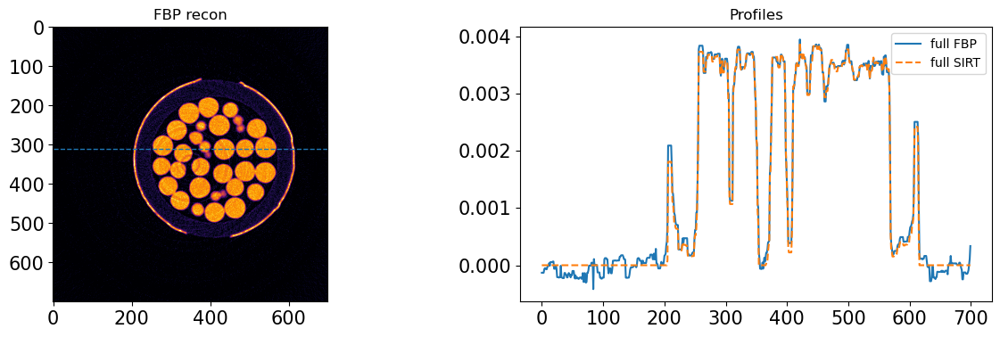

In [77]:
import skimage.filters as filt
import matplotlib.pyplot as plt

prop_cycle = plt.rcParams['axes.prop_cycle']
colors = prop_cycle.by_key()['color']

nh = 310
fig, ax = plt.subplots(1,2,figsize=(15,4))
ax[0].imshow(fbp_recon_2D.as_array(),vmin=0,vmax=0.0045,cmap='inferno')
ax[0].set_title('FBP recon')
ax[0].hlines(nh,xmin=0,xmax=699,color=colors[0], ls = '--', linewidth=1)

N=10
ax[1].plot(filt.median(fbp_recon_2D.as_array()[nh],np.ones(N)),label="full FBP")
#ax[1].plot(filt.median(fbp_recon_2D2.as_array()[nh],np.ones(N)),label="1/2 FBP")
#ax[1].plot(filt.median(fbp_recon_2D4.as_array()[nh],np.ones(N)),label="1/4 FBP")
#ax[1].plot(filt.median(fbp_recon_2D8.as_array()[nh],np.ones(N)),label="1/8 FBP")
ax[1].plot(filt.median(sirt00.solution.as_array()[nh],np.ones(N)),label="full SIRT", ls='--')
#ax[1].plot(filt.median(sirt02.solution.as_array()[nh],np.ones(N)),label="1/2 SIRT", ls='--')
#ax[1].plot(filt.median(sirt04.solution.as_array()[nh],np.ones(N)),label="1/4 SIRT", ls='--')
#ax[1].plot(filt.median(sirt08.solution.as_array()[nh],np.ones(N)),label="1/8 SIRT", ls='--')

ax[1].set_title('Profiles')
ax[1].legend();

### Save tiffs

In [56]:
from cil.io import TIFFWriter
save_base_path ='E:\\Zhan_q\\P20220873\\03_evaluation\\test_06_ct20s'
save_path = os.path.join(save_base_path, 'nv100')
os.makedirs(save_path)

TIFFWriter(data=fbp_recon_2D, file_name=os.path.join(save_path, "fbp0")).write()
TIFFWriter(data=fbp_recon_2D2, file_name=os.path.join(save_path, "fbp2")).write()
TIFFWriter(data=fbp_recon_2D4, file_name=os.path.join(save_path, "fbp4")).write()
TIFFWriter(data=fbp_recon_2D8, file_name=os.path.join(save_path, "fbp8")).write()

TIFFWriter(data=sirt00.solution, file_name=os.path.join(save_path, "sirt00")).write()
TIFFWriter(data=sirt02.solution, file_name=os.path.join(save_path, "sirt02")).write()
TIFFWriter(data=sirt04.solution, file_name=os.path.join(save_path, "sirt04")).write()
TIFFWriter(data=sirt08.solution, file_name=os.path.join(save_path, "sirt08")).write()

TIFFWriter(data=sirtfbp0.solution, file_name=os.path.join(save_path, "sirtfbp0")).write()
TIFFWriter(data=sirtfbp2.solution, file_name=os.path.join(save_path, "sirtfbp2")).write()
TIFFWriter(data=sirtfbp4.solution, file_name=os.path.join(save_path, "sirtfbp4")).write()
TIFFWriter(data=sirtfbp8.solution, file_name=os.path.join(save_path, "sirtfbp8")).write()


### Total Variation Regularisation

In [74]:
from cil.optimisation.functions import L2NormSquared, L1Norm, BlockFunction, MixedL21Norm, IndicatorBox, TotalVariation
from cil.optimisation.operators import GradientOperator, BlockOperator
from cil.optimisation.algorithms import PDHG

# Define BlockFunction F
alpha_tv = 1
f1 = alpha_tv * MixedL21Norm()
f2 = 0.5 * L2NormSquared(b=data_clean8)
F = BlockFunction(f1, f2)

# Define BlockOperator K
Grad = GradientOperator(ig2D8)
K = BlockOperator(Grad, A8)

# Define Function G
G = IndicatorBox(lower=0)

normK = K.norm()
sigma = 2./normK
tau = 1./(2*normK)


# Setup and run PDHG
pdhg_tv_explicit = PDHG(f = F, g = G, operator = K,sigma=sigma, tau=tau,
            max_iteration = 80000,
            update_objective_interval = 500)

In [89]:
pdhg_tv_explicit.run(20000, verbose=2)

     Iter   Max Iter     Time/Iter        Primal          Dual     Primal-Dual
                               [s]     Objective     Objective             Gap
    48000      80000         0.053    6.39631e+01   2.24628e+01    4.15003e+01
    48500      80000         0.053    6.38091e+01   2.25481e+01    4.12610e+01
    49000      80000         0.053    6.36551e+01   2.26292e+01    4.10259e+01
    49500      80000         0.053    6.35157e+01   2.27121e+01    4.08036e+01
    50000      80000         0.053    6.33829e+01   2.28160e+01    4.05670e+01
    50500      80000         0.053    6.32528e+01   2.29096e+01    4.03431e+01
    51000      80000         0.053    6.31183e+01   2.30002e+01    4.01181e+01
    51500      80000         0.053    6.29674e+01   2.30757e+01    3.98916e+01
    52000      80000         0.053    6.28596e+01   2.31553e+01    3.97043e+01
    52500      80000         0.053    6.27146e+01   2.32347e+01    3.94800e+01
    53000      80000         0.053    6.25862e+01   

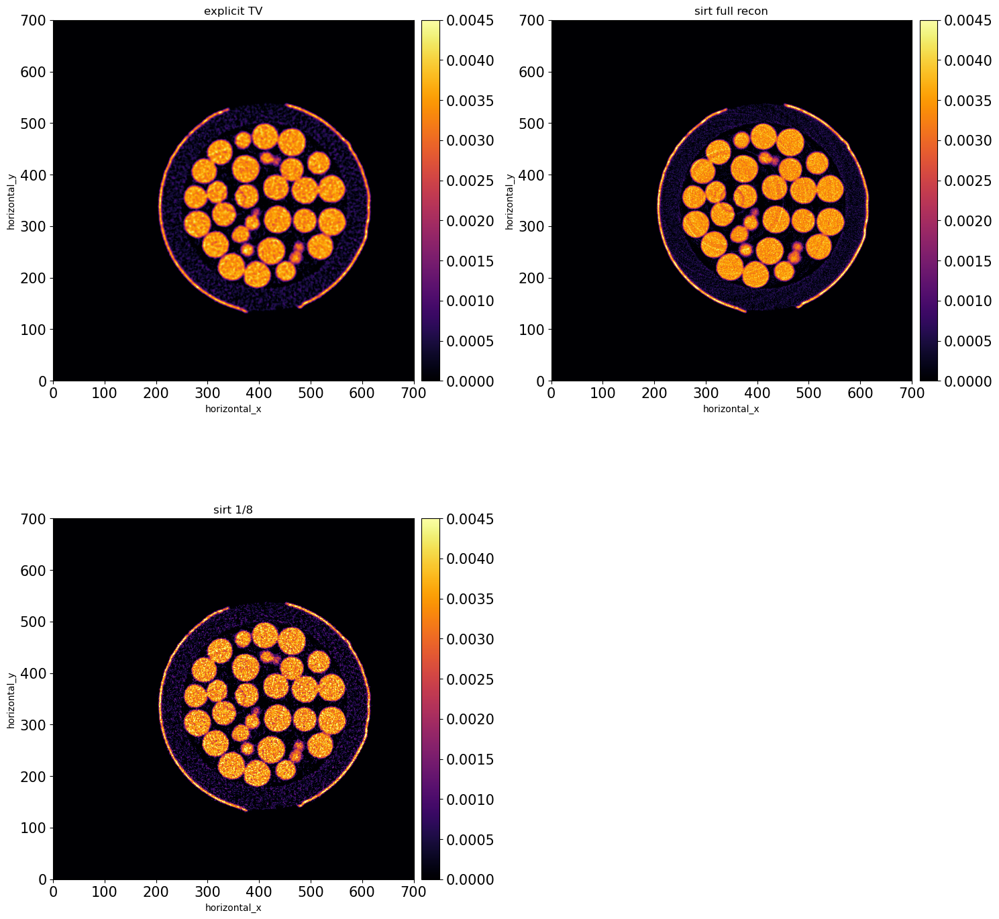

In [90]:
show2D([pdhg_tv_explicit.solution, sirt00.solution, sirt08.solution],
      ['explicit TV', 'sirt full recon', 'sirt 1/8'],
      fix_range=(0,0.0045),
      cmap='inferno')

In [91]:
fbp0_ct20s_600 = fbp_recon_2D
fbp2_ct20s_600 = fbp_recon_2D2
fbp4_ct20s_600 = fbp_recon_2D4
fbp8_ct20s_600 = fbp_recon_2D8
%store fbp0_ct20s_600 
%store fbp2_ct20s_600
%store fbp4_ct20s_600
%store fbp8_ct20s_600

Stored 'fbp0_ct20s_600' (ImageData)
Stored 'fbp2_ct20s_600' (ImageData)
Stored 'fbp4_ct20s_600' (ImageData)
Stored 'fbp8_ct20s_600' (ImageData)
